#Imports and Data

In [1]:
!pip install keras-facenet

!pip install mtcnn

!pip install clusteval

!pip install deepface

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 17.7 MB/s eta 0:00:00
  Created wheel for keras-facenet: filename=keras_facenet-0.3.2-py3-none-any.whl size=10370 sha256=8ac9f7b35a5965062b1ae29ac78883d265134b652de0222114f2acc7120ee2f2
  Stored in directory: /root/.cache/pip/wheels/1d/d8/a9/85cf04ea29321d2afcb82c0caaafdca9195385f9d68cbc7185
Successfully built keras-facenet
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.4/42.4 kB 1.7 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.6/49.6 kB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━

In [2]:
import os
from google.colab import files
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import os
import math 
import cv2

from keras_facenet import FaceNet
from mtcnn.mtcnn import MTCNN
from deepface import DeepFace
from sklearn.cluster import KMeans
from clusteval import clusteval

from PIL import Image
from keras_facenet import FaceNet
from os import listdir
from os.path import join
import shutil

import random
embedder = FaceNet()
facenet_model=embedder.model

Directory  /root /.deepface created
Directory  /root /.deepface/weights created


# separate multiple persons in the same folder

## mctnn and facenet

In [ ]:
# extract a single face from a given photograph
def extract_face(filename, required_size=(160, 160)):
    # load image from file
    image = Image.open(filename)
    # convert to RGB, if needed
    image = image.convert('RGB')
    # convert to array
    pixels = np.asarray(image)
    # create the detector, using default weights
    detector = MTCNN()
    # detect faces in the image
    results = detector.detect_faces(pixels)
    # extract the bounding box from the first face
    if len(results) ==0:
        return []
    x1, y1, width, height = results[0]['box']
    # deal with negative pixel index
    x1, y1 = abs(x1), abs(y1)
    x2, y2 = x1 + width, y1 + height
    # extract the face
    face = pixels[y1:y2, x1:x2]
    # resize pixels to the model size
    image = Image.fromarray(face)
    image = image.resize(required_size)
    face_array = np.asarray(image)
    return face_array


def load_faces(dir):
    faces = list()
    # enumerate files
    for filename in os.listdir(dir):
        path = dir + filename
        face = extract_face(path)
        if(len(face) != 0):
            faces.append(face)
    print("-----------------------------------------------------------------------------------------------------",len(faces))
    return faces

def get_embedding(model, face):
    # scale pixel values
    face = face.astype('float32')
    # standardization
    mean, std = face.mean(), face.std()
    face = (face-mean)/std
    # transfer face into one sample (3 dimension to 4 dimension)
    sample = np.expand_dims(face, axis=0)
    # make prediction to get embedding
    yhat = model.predict(sample)
    return yhat[0]

In [ ]:

dirs= ['39/','105/','180/','240/','528/']
base = '/content/drive/MyDrive/Output_Dataset/clean2_media/8_26_2020_11_52_18_AM_(UTC+02_00)/'
faces = list()
for dir in dirs:
    faces_ = load_faces(base + dir)
    faces = faces + faces_
random.Random(42).shuffle(faces)

# 39: 48 | 180: 51 | 528: 60 | 105: 16 | 240: 50 |||| 225

1/1 [==============================] - 0s 184ms/step
----------------------------------------------------------------------------------------------------- 48
1/1 [==============================] - 0s 227ms/step
----------------------------------------------------------------------------------------------------- 16
1/1 [==============================] - 0s 187ms/step
----------------------------------------------------------------------------------------------------- 51
1/1 [==============================] - 0s 188ms/step
----------------------------------------------------------------------------------------------------- 50
1/1 [==============================] - 0s 155ms/step
----------------------------------------------------------------------------------------------------- 60


In [ ]:
np.savez_compressed('drive/MyDrive/faces.npz', faces)

In [ ]:
faces = np.load('drive/MyDrive/faces.npz')['arr_0']

In [ ]:
emd_faces = list()
for face in faces:
    emd = get_embedding(facenet_model, face)
    emd_faces.append(emd)

1/1 [==============================] - 0s 67ms/step


In [ ]:
emd_faces = np.array(emd_faces)
emd_faces.shape

(225, 512)

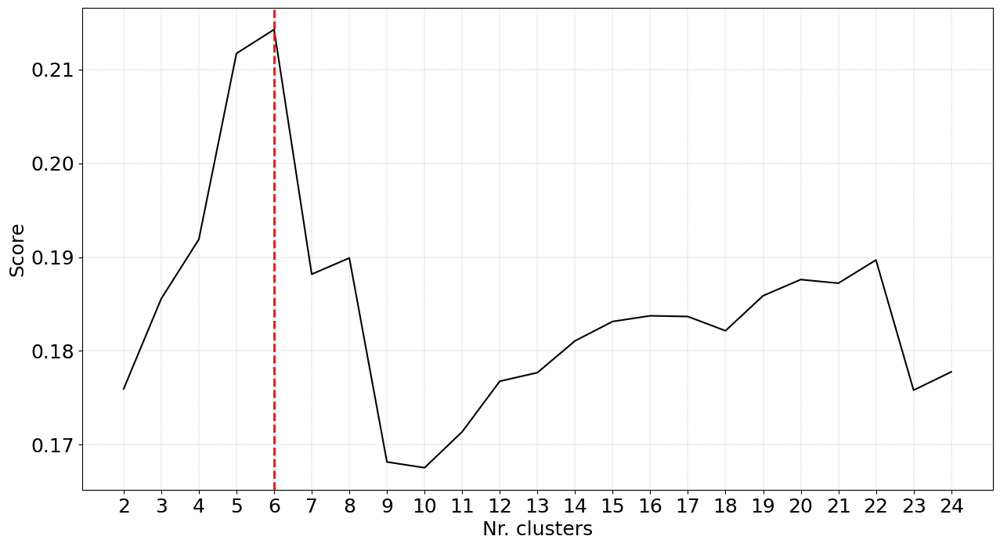

In [ ]:
# Set parameters, as an example dbscan
ce = clusteval(verbose=False)

# Fit to find optimal number of clusters using dbscan
results= ce.fit(emd_faces)

# getting the optimal number of clusters
index = np.argsort(list(results['score']['score']))[-2] # np.argmax(results['score']['score'])
n = int(results['score'].iloc[index]['clusters'])

# Make plot of the cluster evaluation
ce.plot()

# clustering using KMeans
kmeans = KMeans(n_clusters=n, random_state=0, n_init="auto").fit(emd_faces)

labels = kmeans.labels_

In [ ]:
np.unique(labels,return_counts=True)

(array([0, 1, 2, 3, 4, 5], dtype=int32), array([29, 53, 38, 40, 26, 39]))

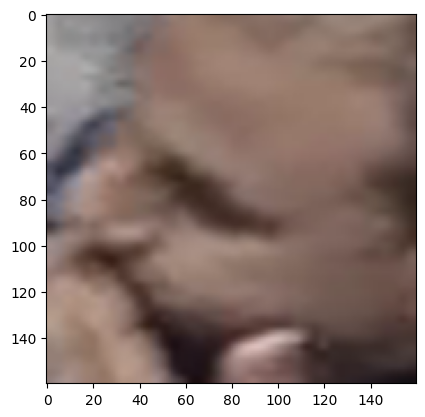

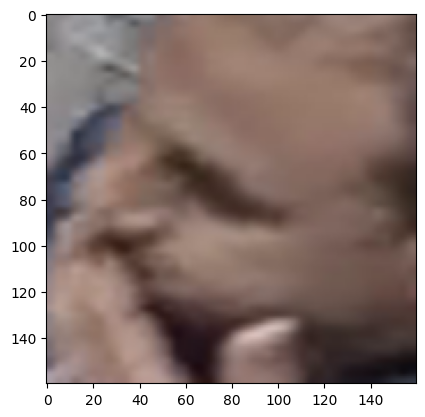

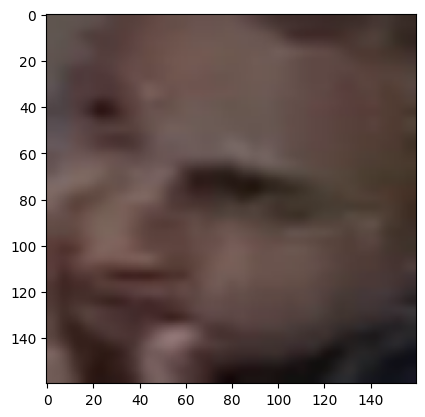

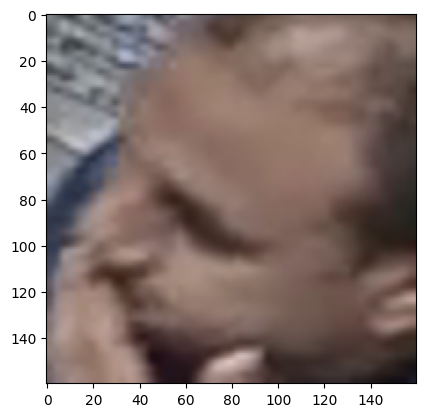

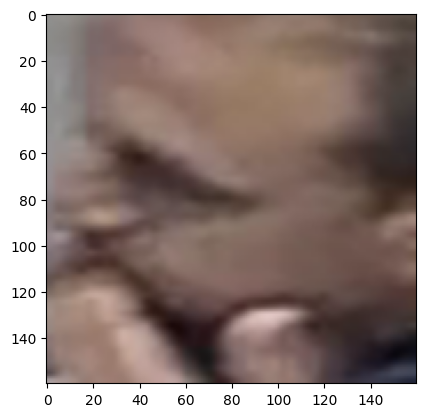

...

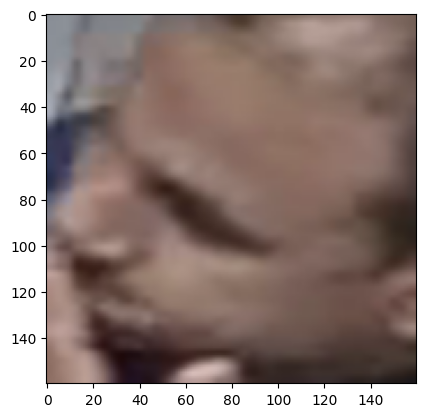

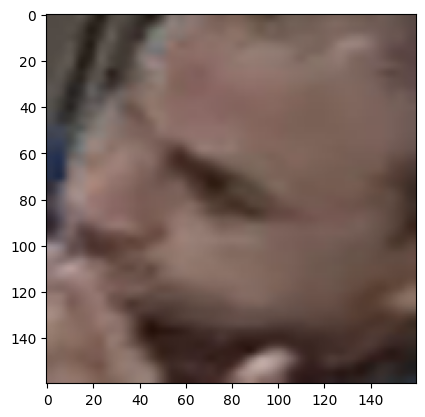

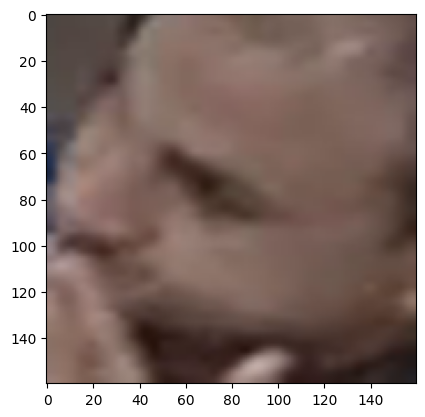

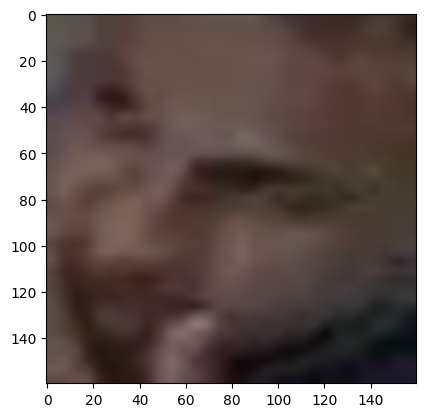

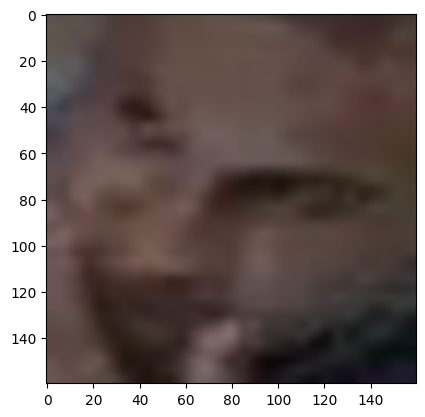

In [ ]:
for i in range(len(faces)):
    if kmeans.labels_[i] ==3:
        plt.figure()
        plt.imshow(faces[i])

## sift

In [ ]:
sift = cv2.xfeatures2d.SIFT_create()
faces_descriptors = list()
for face in faces:
    kp, des = sift.detectAndCompute(face, None)
    faces_descriptors.append(des)

n = int(np.mean([len(face) for face in faces_descriptors])*128)

for i in range(len(faces_descriptors)):
    faces_descriptors[i].resize(n,refcheck=False)

faces_descriptors=np.array(faces_descriptors)

100%|██████████| 23/23 [00:00<00:00, 29.43it/s]


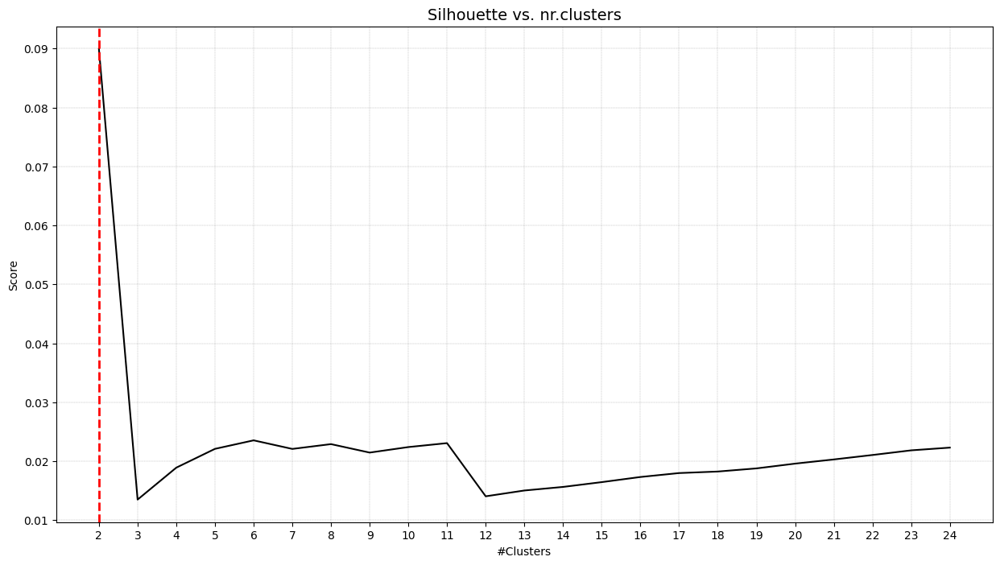

In [ ]:
# Set parameters, as an example dbscan
ce = clusteval(verbose=False)

# Fit to find optimal number of clusters using dbscan
results= ce.fit(faces_descriptors)

# getting the optimal number of clusters
n = int(results['score'].iloc[np.argmax(results['score']['score'])]['clusters'])

# Make plot of the cluster evaluation
ce.plot()

# clustering using KMeans: algorithm = "lloyd","elkan"
kmeans = KMeans(n_clusters=n, random_state=0, n_init="auto",algorithm = "lloyd").fit(faces_descriptors)

labels = kmeans.labels_

In [ ]:
np.unique(labels,return_counts=True)

(array([0, 1], dtype=int32), array([58, 53]))

<ipython-input-27-18a1e24b6a37>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


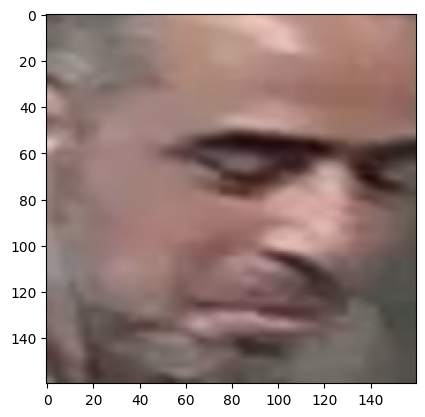

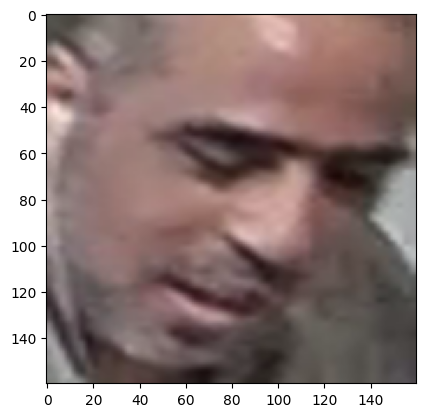

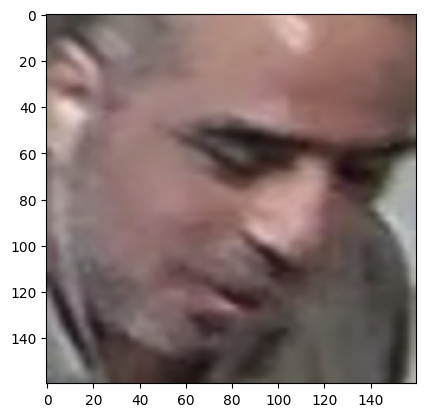

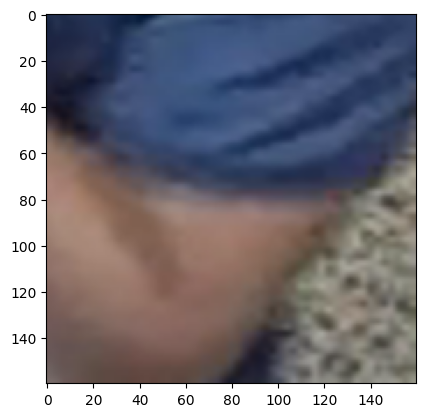

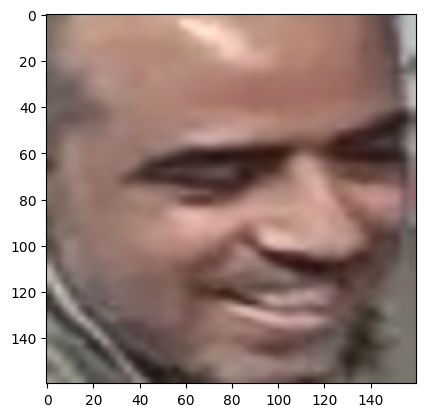

...

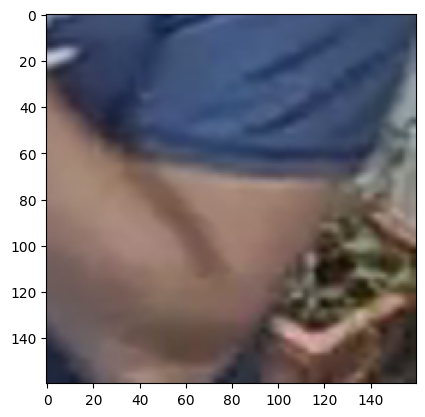

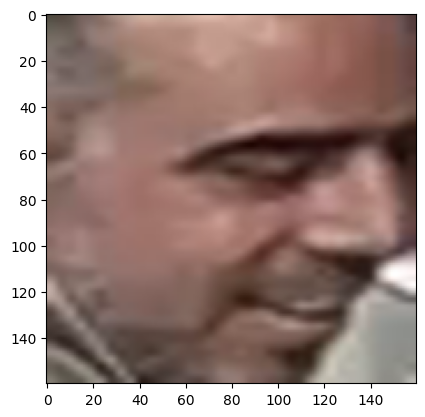

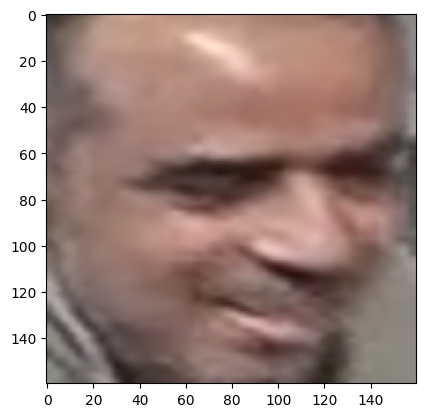

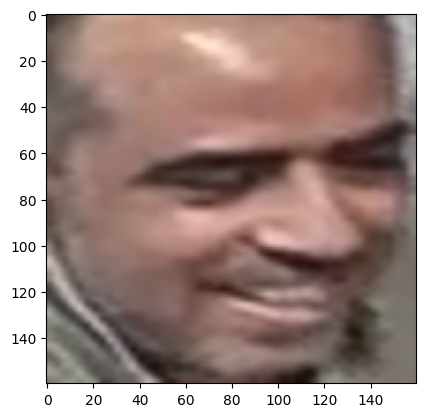

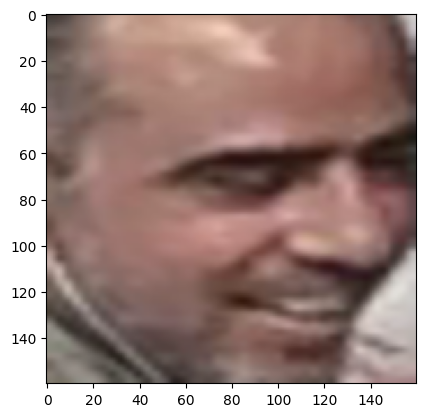

In [ ]:
for i in range(111):
    if kmeans.labels_[i] ==0:
        plt.figure()
        plt.imshow(faces[i])

## DeepFace

In [ ]:
def load_emb_faces(dir,model_name = "Facenet512", backend = "mtcnn"):
    faces = list()
    emb_faces = list()
    # enumerate files
    for filename in os.listdir(dir):
        path = dir + '/' + filename
        try:
            face = DeepFace.extract_faces(img_path = path, detector_backend = backend, target_size = (224, 224))[0]['face']
            emb_face = DeepFace.represent(img_path = path, model_name = model_name, detector_backend = backend)[0]['embedding']
            faces.append(face)
            emb_faces.append(emb_face)
        except :
            pass
    print("-----------------------------------------------------------------------------------------------------",len(faces))
    return faces,emb_faces


In [ ]:
backends = [
    'opencv', 
    'ssd', 
    'dlib', 
    'mtcnn', 
    'retinaface', 
    'mediapipe'
]
models = [
  "VGG-Face", 
  "Facenet", 
  "Facenet512", 
  "OpenFace", 
  "DeepFace", 
  "DeepID", 
  "ArcFace", 
  "Dlib", 
  "SFace",
]
# 39: 48 | 180: 51 | 528: 60 | 105: 16 | 240: 50 |||| 225
dirs= ['39','105','180','240','528']
base = '/content/drive/MyDrive/Output_Dataset/clean2_media/8_26_2020_11_52_18_AM_(UTC+02_00)/'
faces_2, emb_faces_2 = list(), list()
for dir in dirs:
    faces_, emb_faces_ = load_emb_faces(base + dir,model_name = "Facenet512", backend = "mtcnn")
    faces_2 = faces_2 + faces_
    emb_faces_2 = emb_faces_2 + emb_faces_ 
random.Random(42).shuffle(faces_2)
random.Random(42).shuffle(emb_faces_2)

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 164ms/step
----------------------------------------------------------------------------------------------------- 48
1/1 [==============================] - 0s 28ms/step
----------------------------------------------------------------------------------------------------- 14
1/1 [==============================] - 0s 34ms/step
----------------------------------------------------------------------------------------------------- 40
1/1 [==============================] - 0s 35ms/step
----------------------------------------------------------------------------------------------------- 49
1/1 [==============================] - 0s 95ms/step
----------------------------------------------------------------------------------------------------- 56


In [ ]:
np.savez_compressed('drive/MyDrive/mtcnn_faces.npz', faces_2)
np.savez_compressed('drive/MyDrive/mtcnn_emb_faces.npz', emb_faces_2)

In [ ]:
# 39: 49 | 105: 20 | 180: 61 | 240: 61 | 528: 63 |||| 225
#faces_2 = np.load('drive/MyDrive/retina_faces.npz')['arr_0']
#emb_faces_2 = np.load('drive/MyDrive/retina_emb_faces.npz')['arr_0']

# 39: 48 | 105: 16 | 180: 51 | 240: 50 | 528: 60 |||| 225
#faces_2 = np.load('drive/MyDrive/mtcnn_faces.npz')['arr_0']
#emb_faces_2 = np.load('drive/MyDrive/mtcnn_emb_faces.npz')['arr_0']

In [ ]:
faces = np.array(faces_2)
emb_faces_2 = np.array(emb_faces_2)
faces.shape, emb_faces_2.shape

((207, 224, 224, 3), (207, 512))

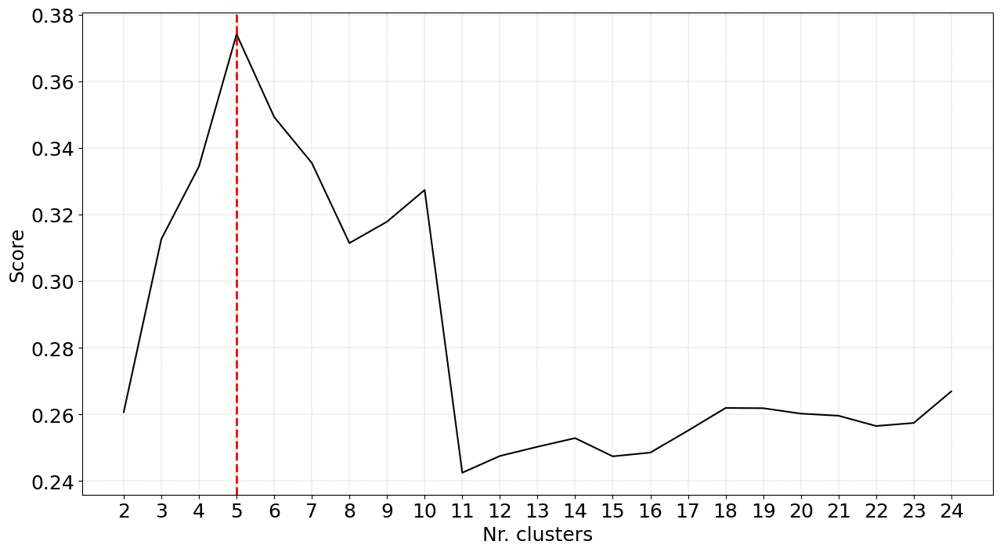

5
(array([0, 1, 2, 3, 4], dtype=int32), array([48, 39, 56, 50, 14]))


In [ ]:
# Set parameters, as an example dbscan
ce = clusteval(verbose=False)

# Fit to find optimal number of clusters using dbscan
results= ce.fit(emb_faces_2)

# getting the optimal number of clusters
index = np.argsort(list(results['score']['score']))[-1] # np.argmax(results['score']['score'])
n = int(results['score'].iloc[index]['clusters'])

# Make plot of the cluster evaluation
ce.plot()

# clustering using KMeans
kmeans = KMeans(n_clusters=n, random_state=0,).fit(emb_faces_2)

labels_2 = kmeans.labels_

print(n)

print(np.unique(labels_2,return_counts=True))

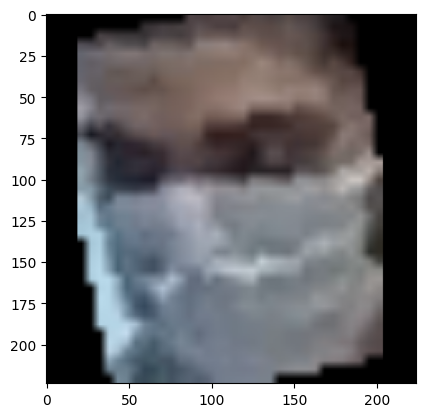

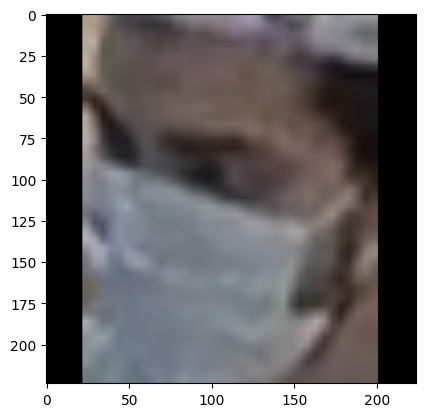

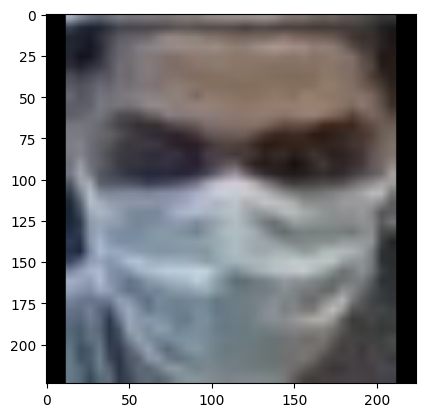

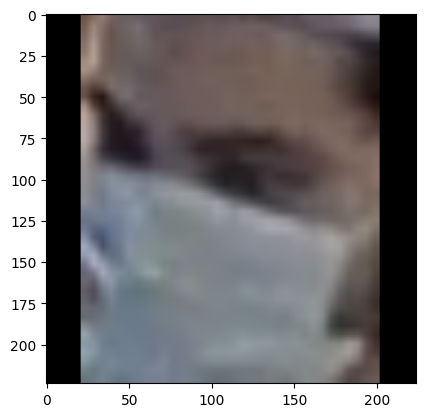

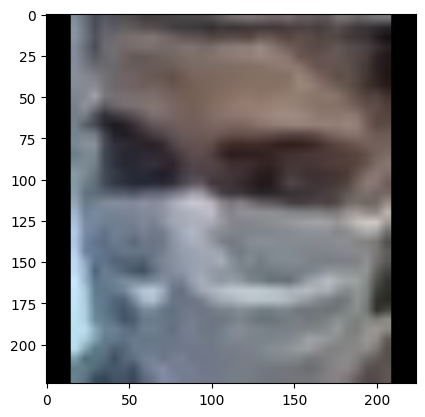

...

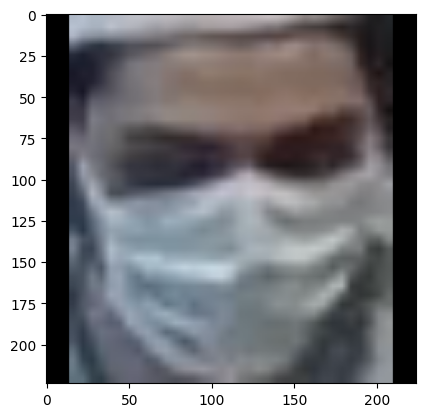

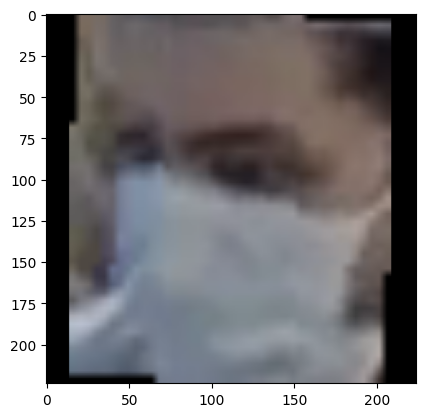

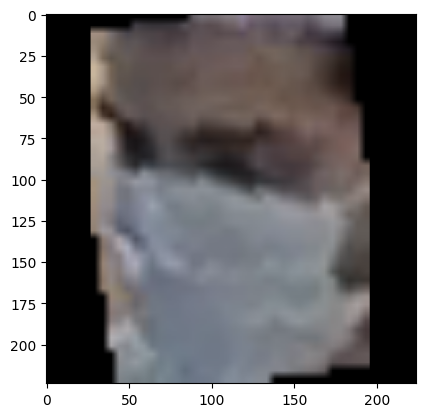

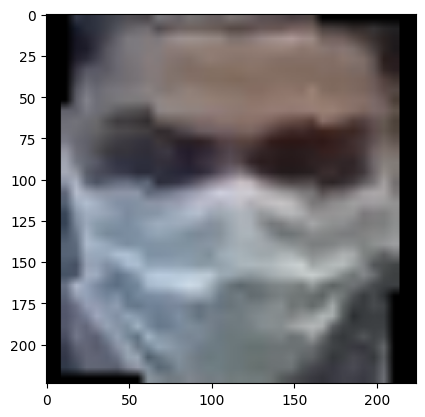

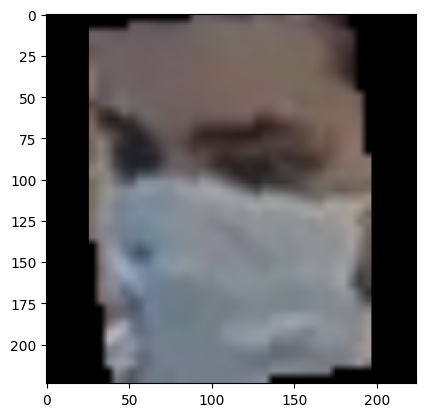

In [ ]:
# 48 15 43 49 56
for i in range(len(labels_2)):
    if labels_2[i] == 3:
        plt.figure()
        plt.imshow(faces_2[i])

## final model

In [ ]:
def load_emb_faces(dir, face_threshold = 0.85):
    emb_faces = list()
    paths = list()
    # enumerate files
    for filename in os.listdir(dir):
        path = dir + '/' + filename
        # if there is a face
        try:
            # get the embedding of the face
            emb_face = embedder.extract(path, threshold=face_threshold,)[0]['embedding']
            emb_faces.append(emb_face)
            paths.append(path)
        except :
            pass
    print("-----------------------------------------------------------------------------------------------------",len(emb_faces))
    return emb_faces,paths

def cluster(emb_faces, n_clusters = -1):
    if(len(emb_faces)==0):
        return []
    # Set parameters, as an example dbscan
    ce = clusteval(verbose=False)

    # Fit to find optimal number of clusters using dbscan
    results= ce.fit(emb_faces)

    # getting the optimal number of clusters
    index = np.argsort(list(results['score']['score']))[-1] # np.argmax(results['score']['score'])
    n = int(results['score'].iloc[index]['clusters'])

    n_clusters = n if n_clusters == -1 else n_clusters
    # clustering using KMeans
    kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(emb_faces)

    labels = np.array(kmeans.labels_)
    return labels

def classify_1folder(datapath, face_threshold = 0.9):
    emb_faces, paths = load_emb_faces(dir,face_threshold)
    labels = cluster(np.array(emb_faces))
    return labels,np.array(paths)
def classify_Folders(dirs, face_threshold = 0.9):
    emb_faces, paths = list(), list()
    for dir in dirs:
        emb_faces_, paths_ = load_emb_faces(dir,face_threshold)
        emb_faces = emb_faces + emb_faces_ 
        paths = paths + paths_
    labels = cluster(np.array(emb_faces))
    return labels,np.array(paths)

In [ ]:
import os
base = '/content/drive/MyDrive/Output_Dataset/clean2_media/8_26_2020_11_52_18_AM_(UTC+02_00)/'
dirs = [x[0] for x in os.walk(base)][1:]
base_output = '/content/drive/MyDrive/Dataset/'
if not os.path.exists(base_output):
    os.makedirs(base_output)
step = 5
max_label = 0
for i in range(0,len(dirs),step):
    folders = dirs[i:i+step]
    labels,paths = classify_Folders(folders)
    for label in np.unique(labels):
        dir = base_output + str(max_label+label)
        os.mkdir(dir)
        for path in paths[labels == label]:
            shutil.copy(path, dir)
    max_label += len(np.unique(labels))
    print(folders)

# move the similar images from target folder to base folder

In [ ]:
def get_my_images(Bdir,Tdir, face_threshold = 0.85, sim_threshold = 0.5, p_threshold = 0.6):
    n = 0
    # get the paths of the target folder images
    paths = np.array([Tdir + '/' + filename for filename in os.listdir(Tdir)])
    # get the embedding of the base folder images
    base = [embedder.extract(Bdir + '/' + filename , threshold= face_threshold)[0]['embedding'] for filename in os.listdir(Bdir)]
    # for every image in the target folder
    for path in paths:
        # get the embedding of the image
        embedding = embedder.extract(path, threshold=face_threshold)[0]['embedding']
        # find the percentage of similar images in the base folder images
        p = np.sum(np.array([embedder.compute_distance(embedding,b) for b in base]) < sim_threshold) / len(base)
        # if the percentage is bigger than 0.3 move the image
        if (p>=p_threshold):
            shutil.move(path, Bdir)
            n+=1
    return n

In [ ]:
for i in range(len(dirs)):
    for j in range(len(dirs)):
        if i == j:
            continue
        print(i, j, get_my_images(dirs[i],dirs[j]))